# IMA207 - Practical work on SAR statistics

### Emanuele DALSASSO, Florence TUPIN, Cristiano ULONDU MENDES, Thomas BULTINGAIRE

### Statistics and despeckling

The practical work is divided in 3 parts

- A. empirical checking of the distributions seen in course for synthetic speckle
- B. computation of equivalent number of looks using images of physically homogeneous areas
- C. spatial multi-looking and implementation of the Lee filter

You have at your disposal several images of various areas acquired by different acquisition modes.
- An oceanfront in São-Paulo acquired by Sentinel-1 sensor (ESA) in GRD (Ground Range Detected) mode
- A farmland near from Bologne (Italy) acquired by TerraSAR-X sensor (ESA) in MGD (Multi Look Ground Range Detected) mode
- An area near from Rome acquired by TerraSAR-X sensor (ESA) in SLC (Single Look Complex) mode
- A temporal stack of images acquired at Flevoland in Netherlands by Alos sensor (JAXA) in SLC mode

Some useful functions are available in the file *mvalab.py*.

### Name: **WRITE YOUR NAME HERE**

#### Instructions

To solve this practical session, answer the questions below. Then export the notebook with the answers using the menu option **File -> Download as -> Notebook (.ipynb)**. Then [submit the resulting file on e-campus by next week.

### Import the libraries and packages we are going to use
The following cell imports all that is going to be necessary for the practical work

In [1]:
# !wget https://perso.telecom-paristech.fr/tupin/TPSAR/mvalab.py

In [2]:
import cmath
import math
from urllib.request import urlopen

import matplotlib.pyplot as plt
import mvalab as mvalab
import numpy as np
import scipy
import scipy as spy
import scipy.fftpack
import scipy.signal
from scipy import ndimage, signal, special

plt.rcParams["figure.figsize"] = [15, 15]
plt.rcParams["figure.max_open_warning"] = 30

## A. Single look data distributions

In this part, we will simulate an SLC (Single Look Complex) SAR image representing an homogeneous area and analyze the pdfs of its intensity and phase.

#### Single look data simulation

According to the Goodman model, the real and imaginary parts of each pixel of an SLC SAR image are independent and identically distributed according to a Gaussian distribution centered and of variance equal to the reflectivity of the pixel divided by 2.\
Choose randomly a reflectity value $R$ in the interval $[100, 200]$ and create a SLC SAR image of size $150\times 150$ representing an homogeneous area of reflectivity $R$.

Affichage d'une image reelle
plt.show dans visusar : image 150 x 150


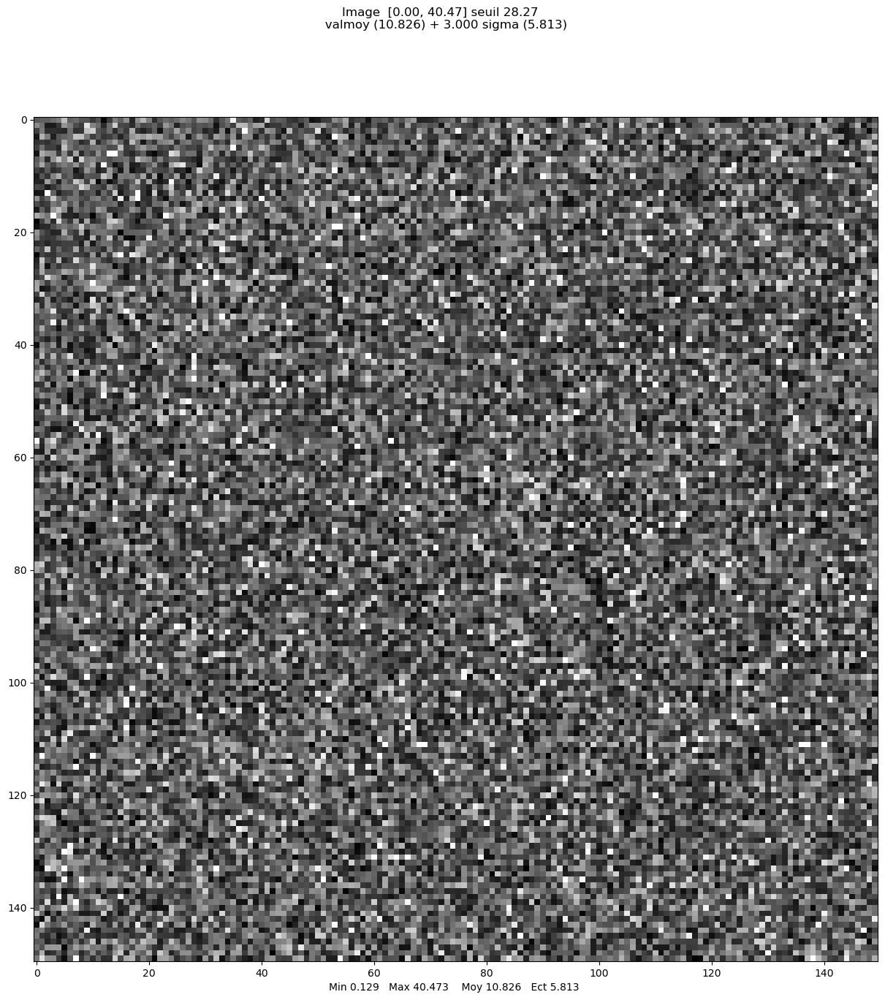

array([[10.03700788, 10.81240228, 10.76053917, ...,  9.20219506,
         3.27294422,  8.86483761],
       [15.45405862, 12.72170036,  3.25915142, ...,  2.49213078,
        10.4975068 , 13.95987463],
       [ 7.48538553, 13.54821052,  5.22966387, ...,  9.17610624,
         0.9086063 ,  9.45479378],
       ...,
       [12.79384674,  8.99743431, 16.71562076, ...,  9.37145753,
         8.72348149,  7.48439601],
       [ 8.89014408, 19.21894877,  4.68887157, ..., 12.91695507,
        11.50703212, 12.18729392],
       [13.50359833, 24.65331592, 16.09186746, ..., 14.76602954,
        11.03811333, 19.31335586]])

In [3]:
# Chose the reflectivity of the homogeneous area
R = np.random.rand(150, 150) * 100 + 100

# Simulate the corresponding SLC image
ima_slc = np.random.normal(scale=np.sqrt(R / 2)) + 1j * np.random.normal(scale=np.sqrt(R / 2))
mvalab.visusar(np.abs(ima_slc))

#### Data distributions for an homogeneous area

compute the distribution of the phase and intensity of your image.
Then, estimate the coefficient of variation:  
$\gamma=\frac{\sigma}{\mu}$ using intensity data (square of the modulus of the complex field)

In [4]:
# Compute the intensity and the phase
ima_int = np.abs(ima_slc) ** 2
ima_ph = np.angle(ima_slc)

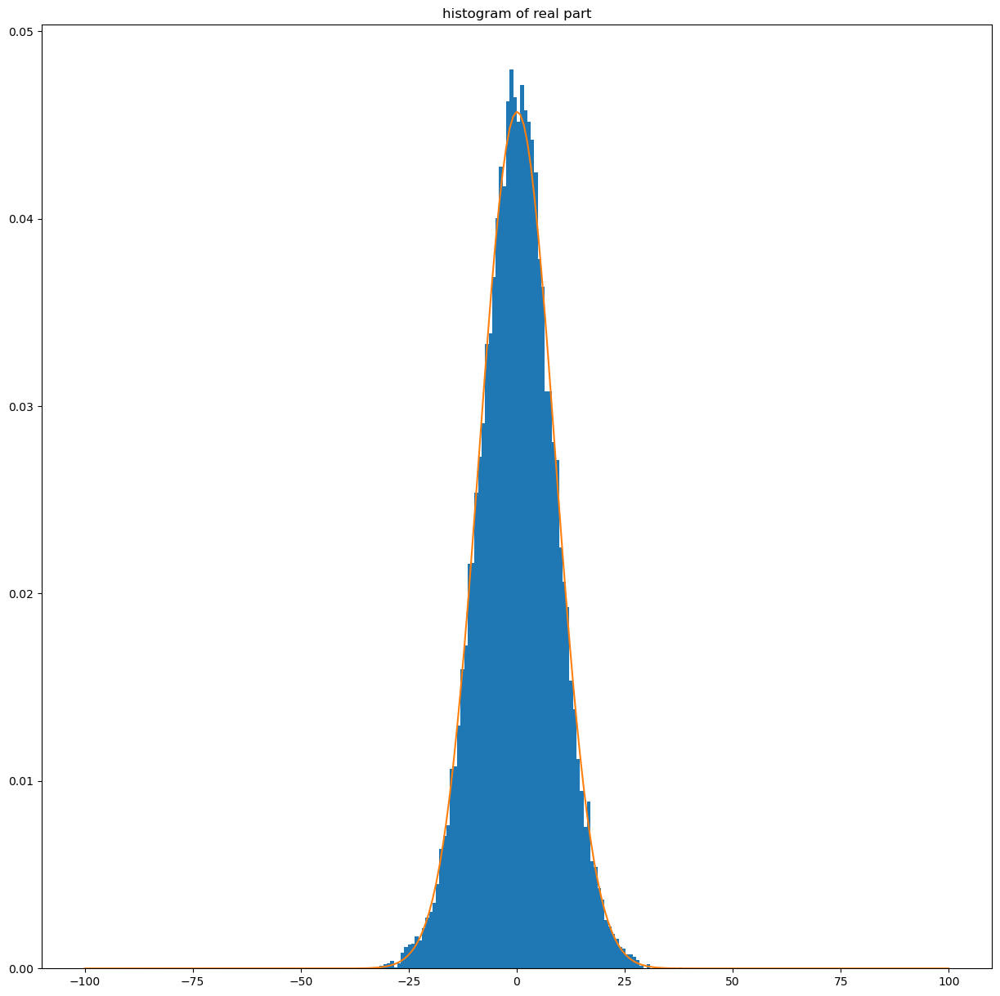

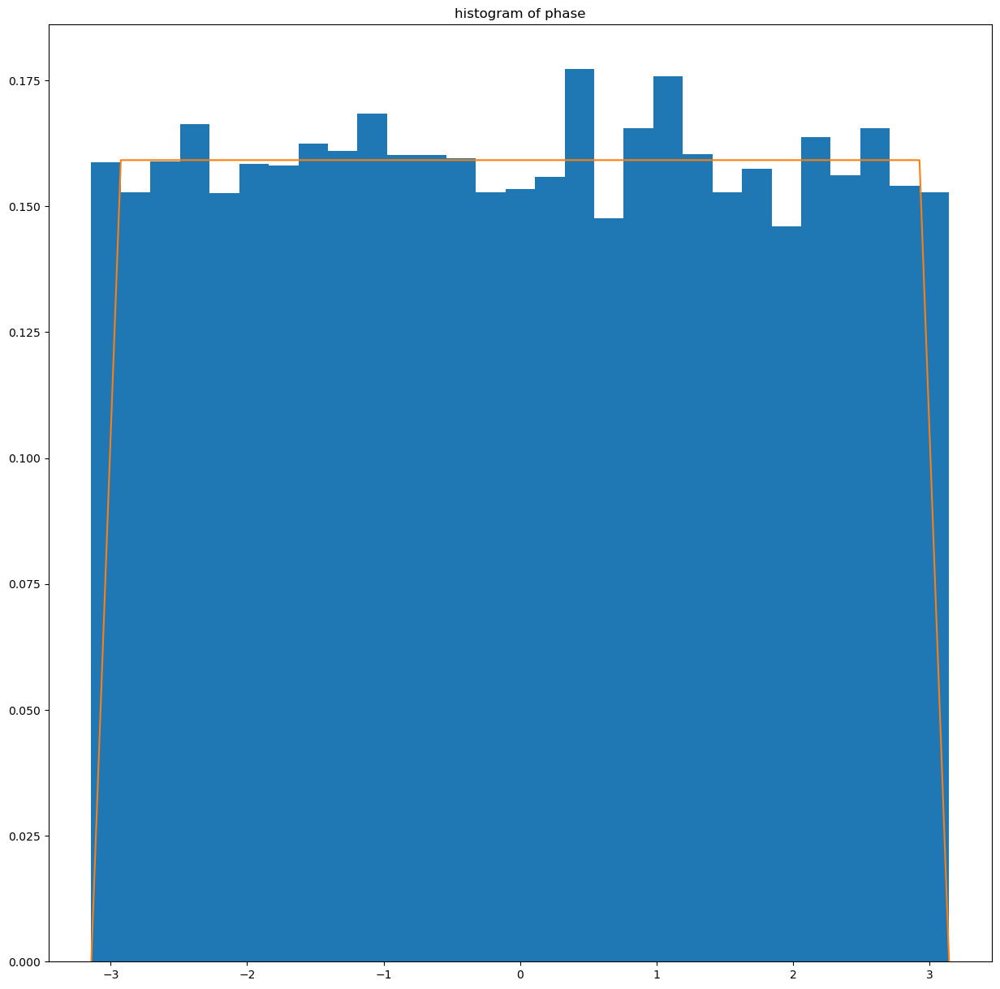

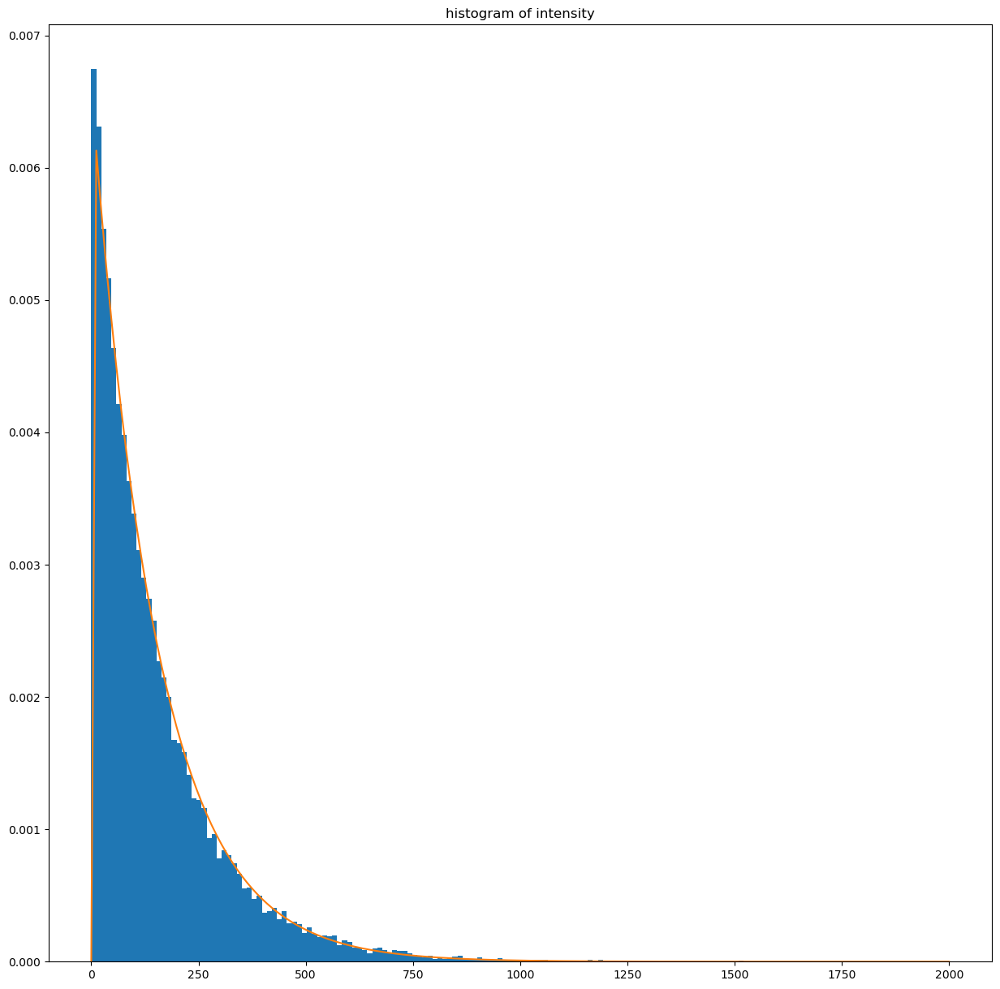

In [5]:
# Plot the histograms and verify they match the theoretical distribution
# Use the right range of values to plot the histogram
# Choose the right distribution to do the fitting

# fitting of the distributions
# use the following ones :
# Gaussian pdf : scipy.stats.uniform
# Rayleigh pdf : scipy.stats.rayleigh
# Exponential pdf : scipy.stats.expon

# example for real part of the data
plt.figure()
# Gaussian distribution
_, bins, _ = plt.hist(
    np.real(ima_slc).ravel(), bins="auto", density=True, range=[-100, 100]
)
mu, sigma = scipy.stats.norm.fit(np.real(ima_slc))
best_fit_line = scipy.stats.norm.pdf(bins, mu, sigma)
plt.plot(bins, best_fit_line)
plt.title("histogram of real part")
plt.show()


# complete for phase data: Uniform distribution
plt.figure()
_, bins, _ = plt.hist(
    ima_ph.ravel(), bins="auto", density=True, range=[-np.pi, np.pi]
)
mu, sigma = scipy.stats.uniform.fit(ima_ph)
best_fit_line = scipy.stats.uniform.pdf(bins, mu, sigma)
plt.plot(bins, best_fit_line)
plt.title("histogram of phase")
plt.show()


# complete for intensity data: Exponential (Gamma) distribution
plt.figure()
_, bins, _ = plt.hist(
    ima_int.ravel(), bins="auto", density=True, range=[0, 2e3]
)
mu, sigma = scipy.stats.expon.fit(ima_int)
best_fit_line = scipy.stats.expon.pdf(bins, mu, sigma)
plt.plot(bins, best_fit_line)
plt.title("histogram of intensity")
plt.show()

In [6]:
# Compute the coefficient of variation on the homogeneous area in intensity

m_I = np.mean(ima_int)
sigma_I = np.std(ima_int)
coeff_var_I = sigma_I / m_I
print(coeff_var_I)

1.0411954546322475


### Question A.1.

Did you find the distributions seen in the course ? (recapitulate them).
Did you find the correct value for the coefficient of variation ? Could this coefficient be less than the theoretical value ?

### Answer A.1.

It's apparent that the real part of the complex image adhere to a Gaussian distribution, while the phase and the intensity follow uniform and exponential distributions, respectively, in accordance with the teachings from our course. As anticipated, the coefficient of variation for intensity nears 1, reflecting the homogeneity of the observed zone. In a heterogeneous area, this coefficient would be higher due to increased variance, despite similar averages. A coefficient less than 1 signifies a noise level relatively low, compared to the signal intensity, which, despite being atypical, is possible.

## B. Computation of the Equivalent Number of looks on homogeneous areas
In this part you have at your disposal 2 images a part of an ocean (São Paulo) and a part of a field (Bologne, Italy). The first is acquired by Sentinel-1 GRD, and the second by TerraSAR-X GRD. The multi-looking has been done by the data provider (ESA, European Space Agency).

Use the value of the coefficient of variation to find the Equivalent Number of Looks (ENL) of the Sentinel-1 GRD and TerraSAR-X GRD data.
The formula is :
- $\gamma_I=\frac{1}{\sqrt{L}}$ for intensity data

In [7]:
# Download the images
# !wget "https://partage.imt.fr/index.php/s/M3yeW5ozcsHyigR/download/s1_grd_saopaulo.npy"
# !wget "https://partage.imt.fr/index.php/s/TTRfS6XKCzSM6cS/download/tsx_grd_bologne.npy"

Affichage d'une image reelle
plt.show dans visusar : image 250 x 250


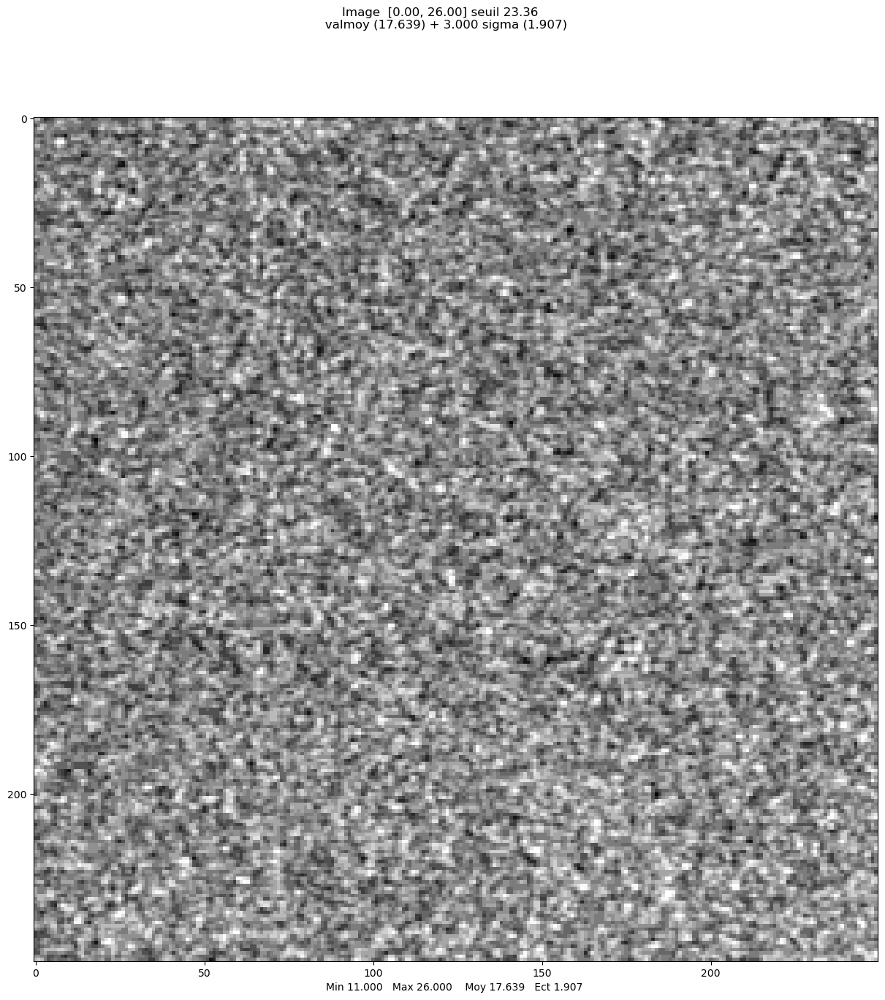

--- coeff var and L ---
0.21648477
21.33758686719461


In [8]:
im_s1grd = np.load("s1_grd_saopaulo.npy").astype(np.float32)  # amplitude
im_s1grd_mer = im_s1grd[50:300, 100:350]
mvalab.visusar(im_s1grd_mer)

# compute coefficient of variation and number of looks
im_int = np.abs(im_s1grd_mer) ** 2
coeff_var_grd = np.std(im_int) / np.mean(im_int)
L_grd = 1 / coeff_var_grd**2
print("--- coeff var and L ---")
print(coeff_var_grd)
print(L_grd)

Affichage d'une image reelle
plt.show dans visusar : image 250 x 250


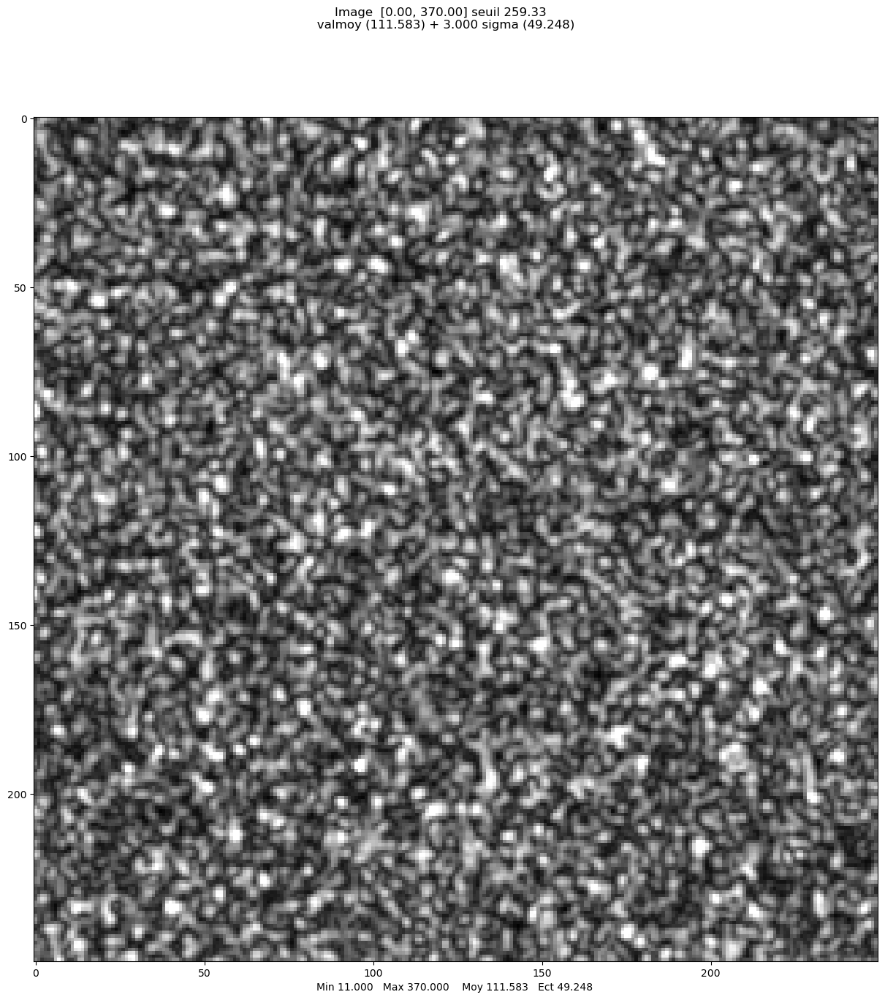

--- coeff var and L ---
0.90074235
1.2325337872691504


In [9]:
im_tsxgrd = np.load("tsx_grd_bologne.npy").astype(np.float32)  # amplitude
im_tsxgrd_champ = im_tsxgrd[700:950, 300:550]
mvalab.visusar(im_tsxgrd_champ)

# compute coefficient of variation and number of looks
im_int = np.abs(im_tsxgrd_champ) ** 2
coeff_var_xgrd = np.std(im_int) / np.mean(im_int)
L_grd = 1 / coeff_var_xgrd**2
print("--- coeff var and L ---")
print(coeff_var_xgrd)
print(L_grd)

### Question B.1
Comment the number of looks you have found for GRD date from Sentinel-1 and TerraSAR-X (is it an integer value ? why not ? what does it mean ?).

### Answer B.1

The ENL, or Equivalent Number of Looks, serves as a measure of the effective number of independent samples or looks utilized in the multi-looking process, a prevalent technique in SAR image processing aimed at speckle filtering. Multi-looking entails averaging multiple independent samples to mitigate speckle noise, resulting in a smoother visual representation. However, it's crucial to note that the samples employed for multi-looking aren't strictly independent and identically distributed (i.i.d.), leading to fractional effective looks and non-integer ENL values.

A higher ENL value, such as the approximately 21.34 observed for the Sentinel-1 GRD image, indicates substantial multi-looking and effective speckle reduction, rendering the image smoother and more suitable for homogeneous areas like the ocean. Conversely, a lower ENL value, exemplified by the roughly 1.23 for the TerraSAR-X GRD image, suggests minimal multi-looking and higher residual speckle noise, which, in turn, preserves spatial details and texture. This preservation can be advantageous for heterogeneous areas like agricultural fields or urban environments.

## C. Spatial multi-looking and implementation of the Lee filter

In this part we will try simple speckle reduction method using the following step :
- first we will compute a mean filter
- then we will compute the local coefficient of variation (using the same size for the moving window)
- finally we will combine these two results to obtain the Lee filter.

## C.1 Computation of the mean filter
Compute the mean filter using a 2D convolution.

In [10]:
# Download the image
# !wget "https://partage.imt.fr/index.php/s/cbRqjnSJEfD2zJ8/download/tsx_slc_rome.npy"

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


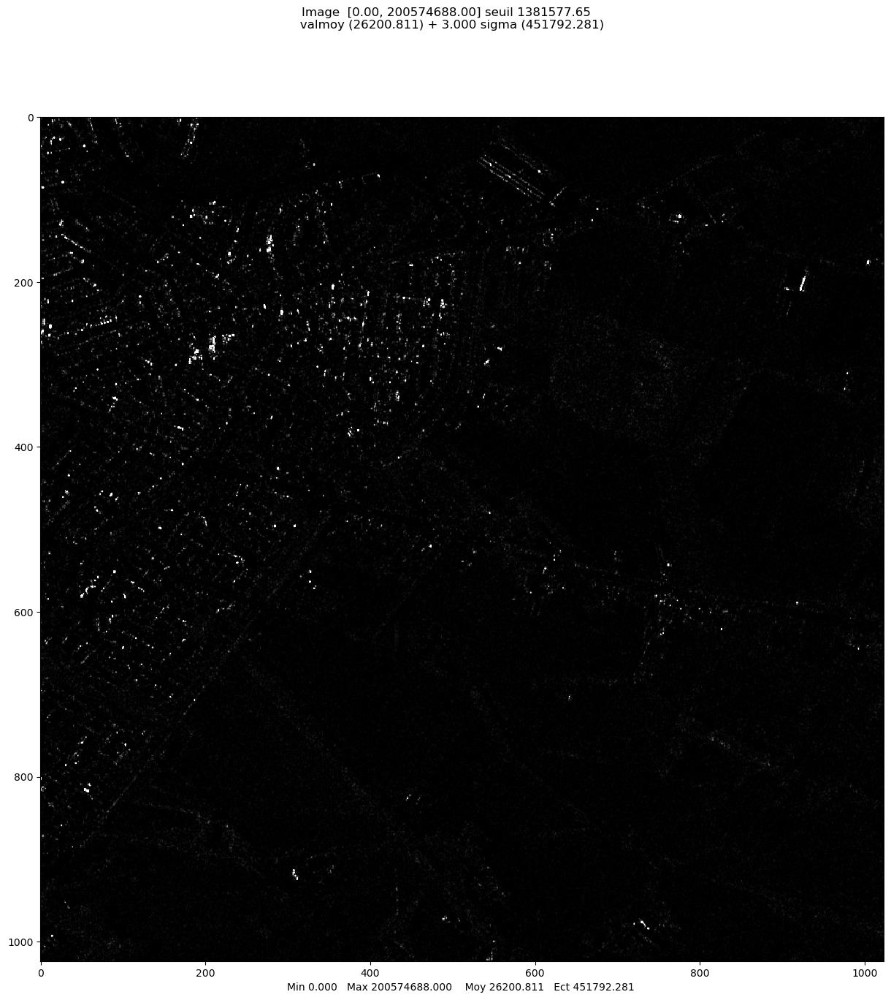

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


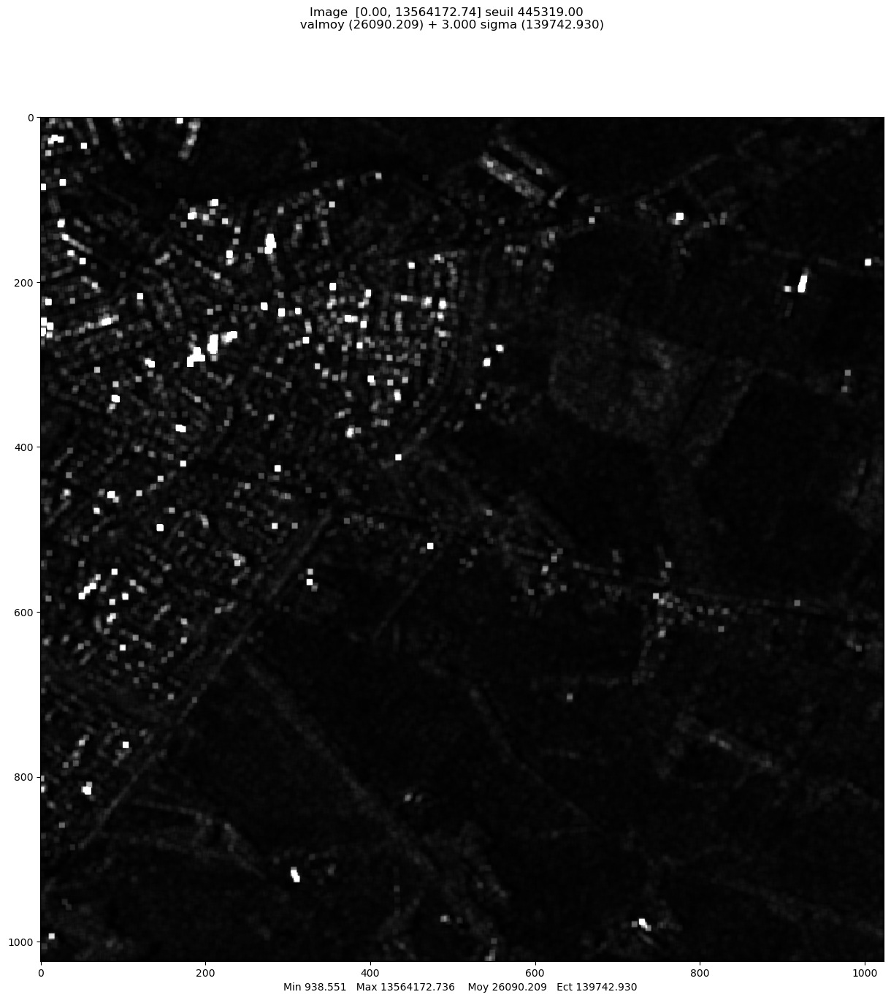

array([[33816.42965761, 34034.96026238, 34968.49086466, ...,
         3798.57140989,  1979.30612868,  1236.02043681],
       [36073.61314672, 36329.89885603, 37642.7355409 , ...,
         4084.93872818,  2235.26528619,  1439.85715033],
       [40843.89894073, 41351.96014031, 42968.87847776, ...,
         4618.34688272,  2751.18364233,  1636.89795545],
       ...,
       [ 3967.06126435,  4515.91840721,  5213.61231496, ...,
         8101.44900575,  7294.10211182,  6175.57148462],
       [ 2986.79592833,  3509.91838229,  3830.63265836, ...,
         6221.87759711,  5567.87762202,  4912.36740299],
       [ 2730.24490543,  3179.816334  ,  3436.02040598, ...,
         4457.93883655,  3938.97968775,  3338.73476986]])

In [11]:
ima_tsxslc = np.load("tsx_slc_rome.npy")  # amplitude

# take the intensity
ima_int = np.abs(ima_tsxslc) ** 2
mvalab.visusar(ima_int)

# create the average window
size_window = 7
mask_loc = np.ones((size_window, size_window)) / (size_window**2)

# compute the mean image (intensity data)
ima_int_mean = signal.convolve2d(ima_int, mask_loc, mode="same")

# display the result
mvalab.visusar(ima_int_mean)

### Question C.1
What is the effect of the mean filter ? (advantages and drawbacks). What is the influence of the window size ?

### Answer C.1

The mean filter, a fundamental linear filter in image processing, is commonly utilized for noise reduction by replacing each pixel value with the average of its neighboring pixels within a specified window or kernel size. Its advantages lie in its effectiveness at reducing speckle noise, resulting in a smoother image, coupled with its simplicity to implement and computational efficiency. However, drawbacks include its tendency to blur edges and diminish fine details, thereby compromising the sharpness and clarity of the image. Altering the window size allows us to manipulate the outcome of the mean filter application: a smaller window size preserves more details and edges while retaining more speckle noise, while a larger window size provides greater speckle reduction at the expense of increased blurring of edges and loss of fine details.

## C.2 Lee filter

Given a neighborhood, the Lee filter of an image $I_s$ can be computed by the following steps:

*   Compute the local mean of the image $\hat{\mu}_{s}$
*   Compute $k_s$ given by:
$$
  k_s=1- \frac{\gamma_{Sp}^2}{\hat{\gamma}_s^2}
$$
where $\gamma_{Sp}$ is the theoretical value of the coefficient of variation for a pure speckle ($\gamma_{Sp}=\frac{1}{\sqrt{L}}$ for a L-look intensity image), and $\hat{\gamma}_s$ is the empirical value of the coefficient of variation for the given neighborhood.
*   Compute the final filtered image
$$
  \hat{I}_s= \hat{\mu}_{s}+k_s (I_s-\hat{\mu}_{s})
$$

Create a function performing Lee filter on an image, for a given neighborhood and number $L$ of look.

Then, knowing that a SLC image is a 1-look image, compute the Lee filter on the intensity image of "ima_tsxslc"

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


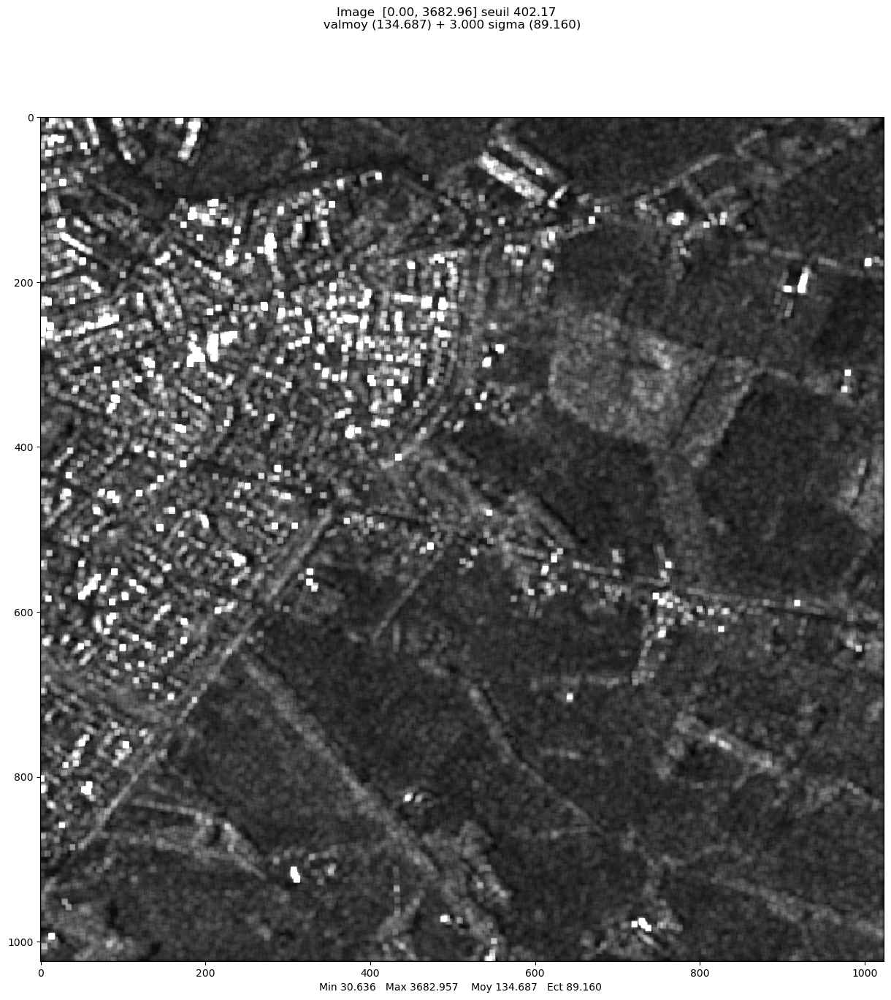

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


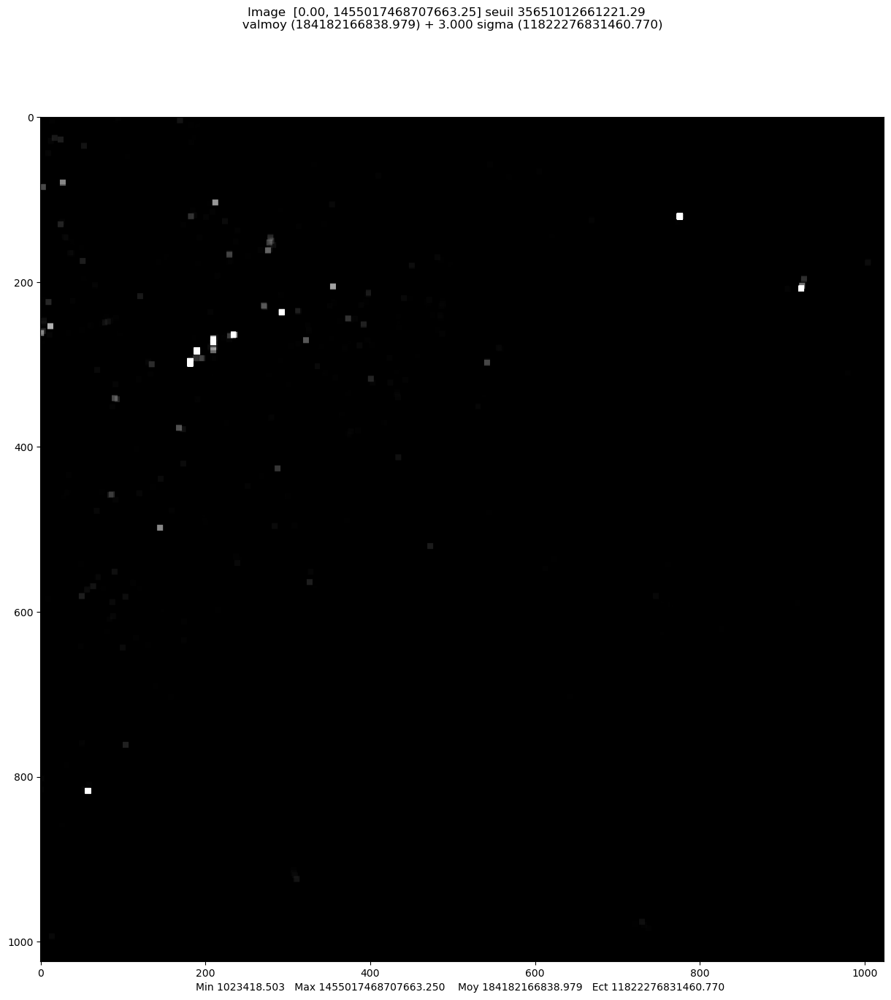

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


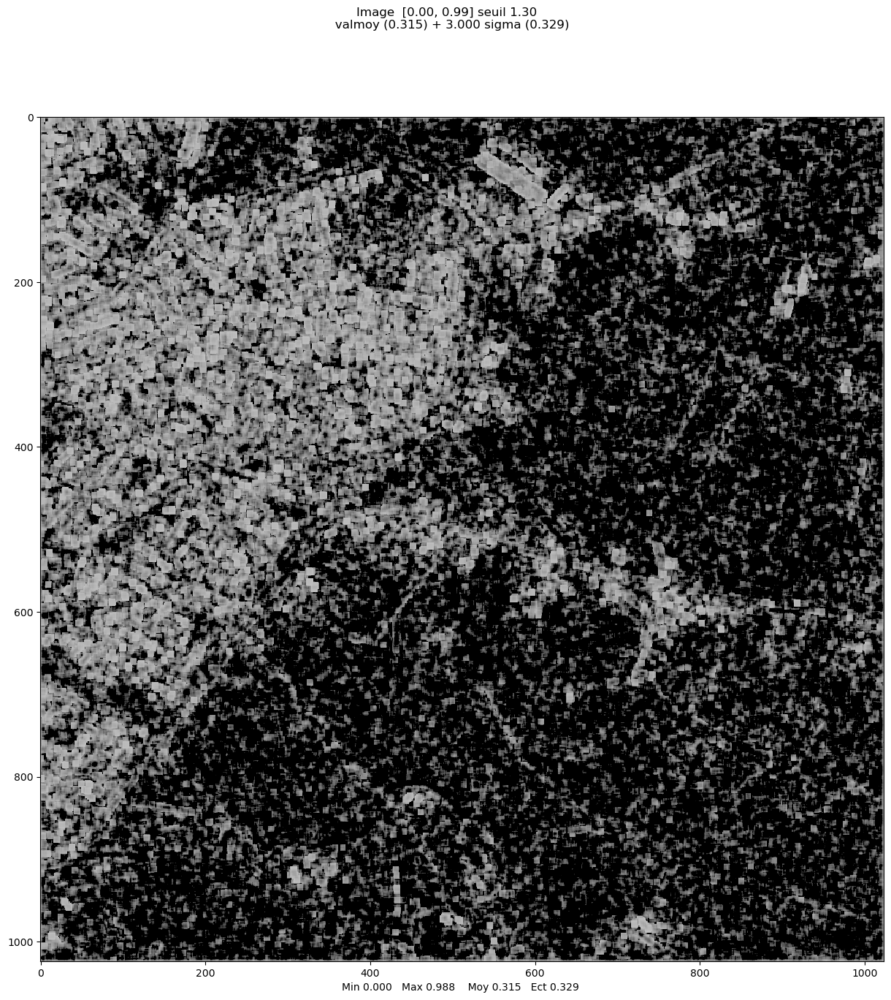

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


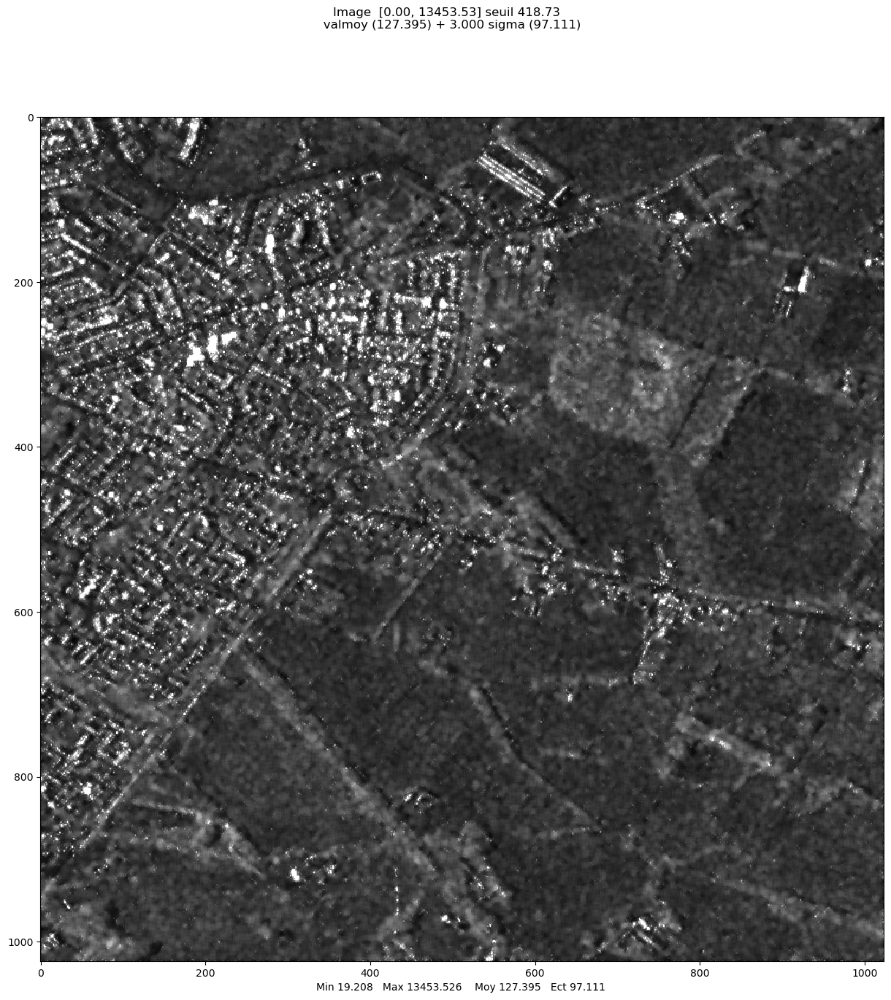

array([[144.00413727, 308.36183233, 418.72866519, ...,  64.55605282,
         86.24329446, 112.81753373],
       [190.04858887, 418.72866519, 418.72866519, ...,  43.61261524,
         65.84179831,  29.56000307],
       [234.64043021, 418.72866519, 351.03721453, ...,  50.61296111,
         32.24712371,  28.44227807],
       ...,
       [ 84.26142301,  75.181164  ,  71.41213092, ..., 120.50446688,
         99.10429479,  51.0522139 ],
       [ 77.25169039,  93.77458808,  77.26014126, ...,  98.28983025,
         70.83758473, 106.03256301],
       [ 53.89435933,  56.73688736,  91.1884864 , ...,  93.50540263,
         48.2759747 , 115.68994217]])

In [12]:
def lee_filter(im, neighborhood=7, L=1, visualize=False):
    # Mask
    mask = np.ones((neighborhood, neighborhood)) / (neighborhood**2)

    # Compute local mean image
    im_mean = signal.convolve2d(im, mask, mode="same")

    # Compute local coefficient of variation (thanks to local variance and local mean)
    im_var = signal.convolve2d(im**2, mask, mode="same") - im_mean**2
    ks = 1 - (1 / L) / (im_var / (im_mean**2))
    ks = np.clip(ks, 0, 1)

    # Compute Lee filter
    filtered_im = im_mean + ks * (im - im_mean)

    # Visualizations
    if visualize:
        mvalab.visusar(np.sqrt(im_mean))
        mvalab.visusar(im_var)
        mvalab.visusar(np.sqrt(ks))

    return filtered_im



lee_filtered_int = lee_filter(ima_int, neighborhood=7, L=1, visualize=True)

mvalab.visusar(np.sqrt(lee_filtered_int))

### Question C.2
Which information is enhanced in the image of the local standard deviation ? In the image of the local coefficient of variation ? Which one is the more useful ?

### Answer C.2

The local standard deviation image (im_var) serves to enrich contrast and emphasize texture details within the image, accentuating regions with notable local variations, often corresponding to edges, boundaries, and textured areas. Conversely, the local coefficient of variation image (np.sqrt(ks)) amplifies the presence of speckle noise, highlighting areas where the local standard deviation exceeds the local mean, a hallmark of speckle noise in SAR images. Consequently, the local coefficient of variation image (np.sqrt(ks)) proves more advantageous for discerning meaningful features amidst speckle noise, owing to its provision of a normalized measure of variability.

### Question C.3

Compare the results of the mean filter and the Lee filter. Study the influence of the size of the window of the filters.


### Answer C.3

The mean filter offers some noise reduction capabilities but struggles to eliminate significant speckle while potentially blurring fine details. In contrast, the Lee filter effectively mitigates speckle noise while conserving edges and crucial details, achieving this balance by dynamically adjusting the filtering strength according to the local coefficient of variation. The choice of window size plays a pivotal role in filter performance: smaller window sizes excel at detail preservation but may leave behind residual speckle noise, whereas larger window sizes enhance noise reduction at the expense of detail clarity. Notably, the Lee filter demonstrates superior management of this trade-off compared to the mean filter, making it a preferred option for various image processing tasks.

## Filtering of image "Lely" and comparison with a deep learning algorithm
In this part, we will repeat the process done above to denoise a crop of image "Lely" using the Lee filter. Then, we will compare it with the result of a deep learning algorithm called SAR2SAR (https://arxiv.org/abs/2006.15037).

## C.4 Denoised image: SAR2SAR
The Lee filter presents some limits. More recent approaches to suppress noise rely on sofisticated algorithms. You can plot the image of Lely denoised using a deep learning algorthm called SAR2SAR and compare visually the result with the image filtered using the Lee filter.
  

In [13]:
# Download the image
# !wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.IMA
# !wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.dim

imz2mat : version janvier 2018.  Fichier à ouvrir : lely_tuple_multitemp.IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
Dans ximaread : lecture du canal 0/25
image en .IMA
image en .IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
image en .ima  512   512   canaux: 25  verif :  1
512 512
-type CFLOAT
lecture de  lely_tuple_multitemp.IMA  en quelconque 512 512 25  offset  0 <f 4  complex 1 blocksize 2097152
Boucle de lecture entre 0 et 25   sur 25 canaux
Lecture du canal 1/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 2/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 3/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 4/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 5/25
Données complexes (standard). Nouvelle version de imz2mat 

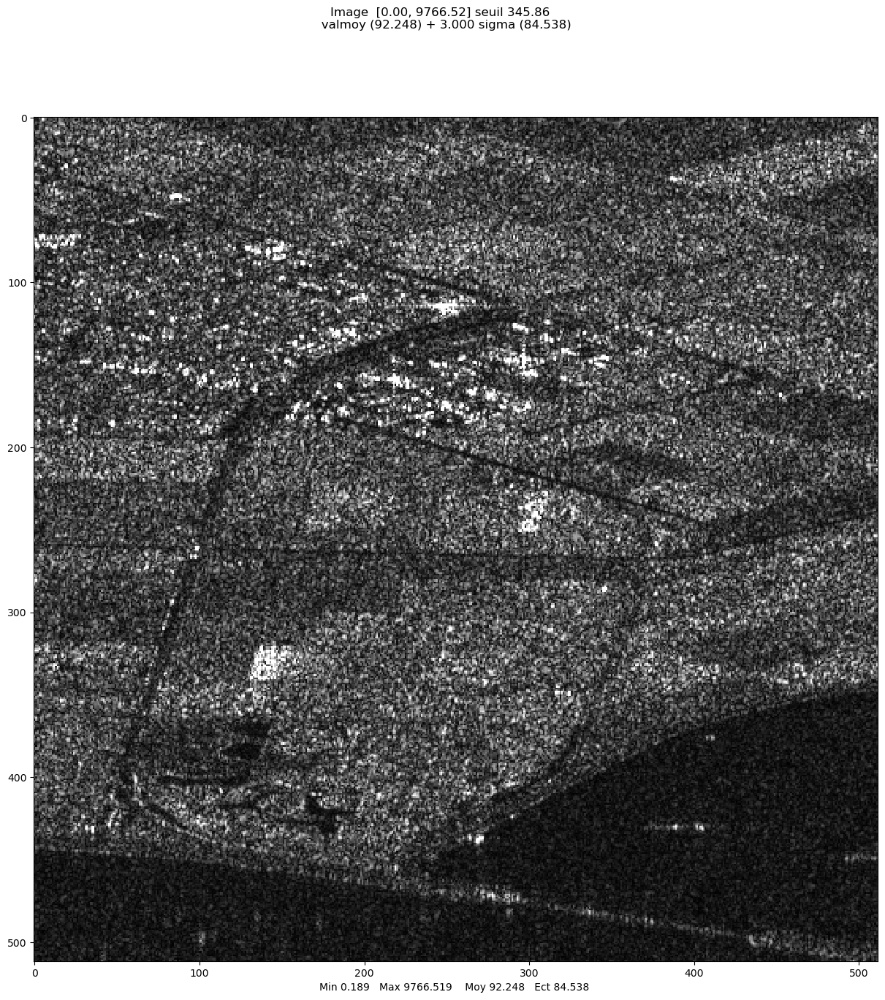

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


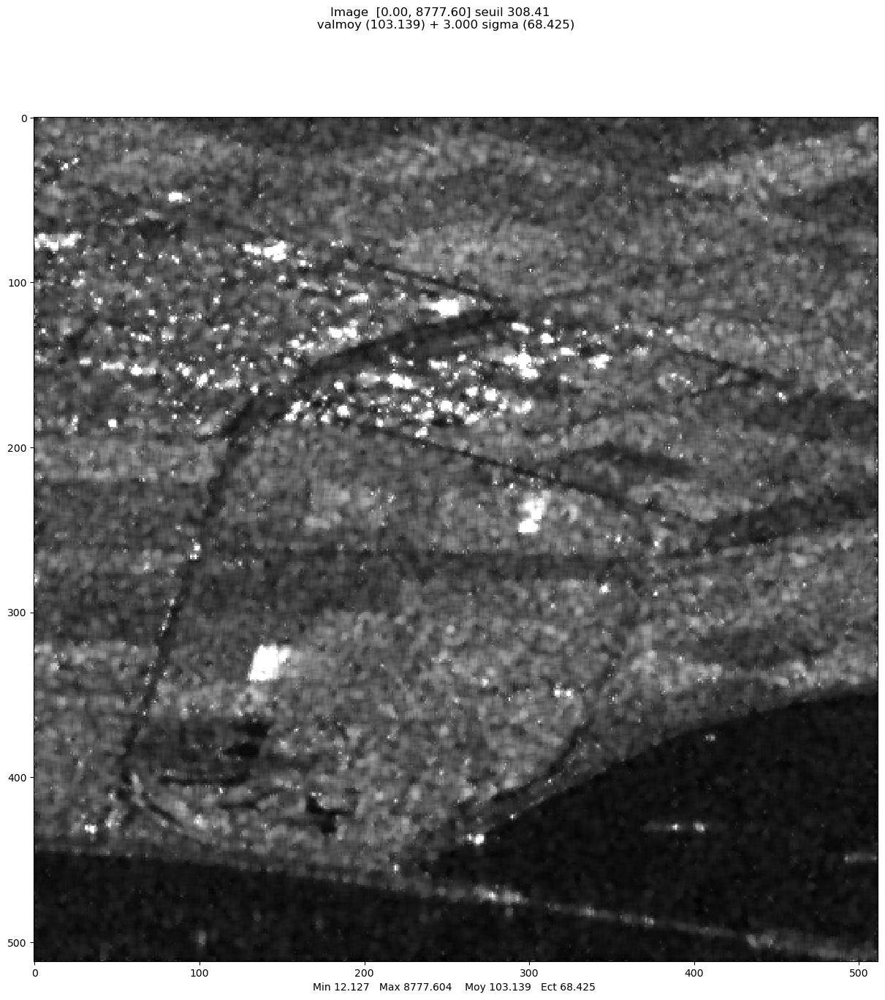

array([[ 68.89086899,  59.00943903,  78.62079749, ...,  47.64057136,
         50.05070571,  47.92380963],
       [ 46.45969791,  53.33040287,  76.81468018, ...,  95.19890164,
         83.06174815,  47.57592921],
       [ 56.35291552,  82.56396901, 101.52331965, ...,  99.81779615,
         84.89170049,  73.87549192],
       ...,
       [ 29.61453151,  32.47175043,  36.81431802, ...,  75.2869592 ,
         72.15065475,  60.58204956],
       [ 19.80323135,  28.79317517,  30.65607682, ...,  69.86896354,
         63.91231341,  70.15091784],
       [ 24.17833487,  41.23106887,  19.58726139, ...,  71.86461615,
         41.5469726 ,  99.32781523]])

In [14]:
# date is on thrid axis of part_lely_slc
part_lely_slc = mvalab.imz2mat("lely_tuple_multitemp.IMA")[0]
# single look complex image
part_lely_slc = part_lely_slc[:, :, 0]
mvalab.visusar(part_lely_slc)


# using your previous code, filter the image part_lely_int with the Lee filter
part_lely_int = np.abs(part_lely_slc)**2
lee_filtered_int = lee_filter(part_lely_int, neighborhood=5, L=1, visualize=False) #complete
mvalab.visusar(np.sqrt(lee_filtered_int))

imz2mat : version janvier 2018.  Fichier à ouvrir : lely_tuple_multitemp_SAR2SAR.IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
Dans ximaread : lecture du canal 0/25
image en .IMA
image en .IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
image en .ima  512   512   canaux: 25  verif :  1
512 512
-type FLOAT
lecture de  lely_tuple_multitemp_SAR2SAR.IMA  en quelconque 512 512 25  offset  0 <f 4  complex 0 blocksize 1048576
Boucle de lecture entre 0 et 25   sur 25 canaux
Lecture du canal 1/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 2/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 3/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 4/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 5/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 6/25
Données réelles. Nouvell

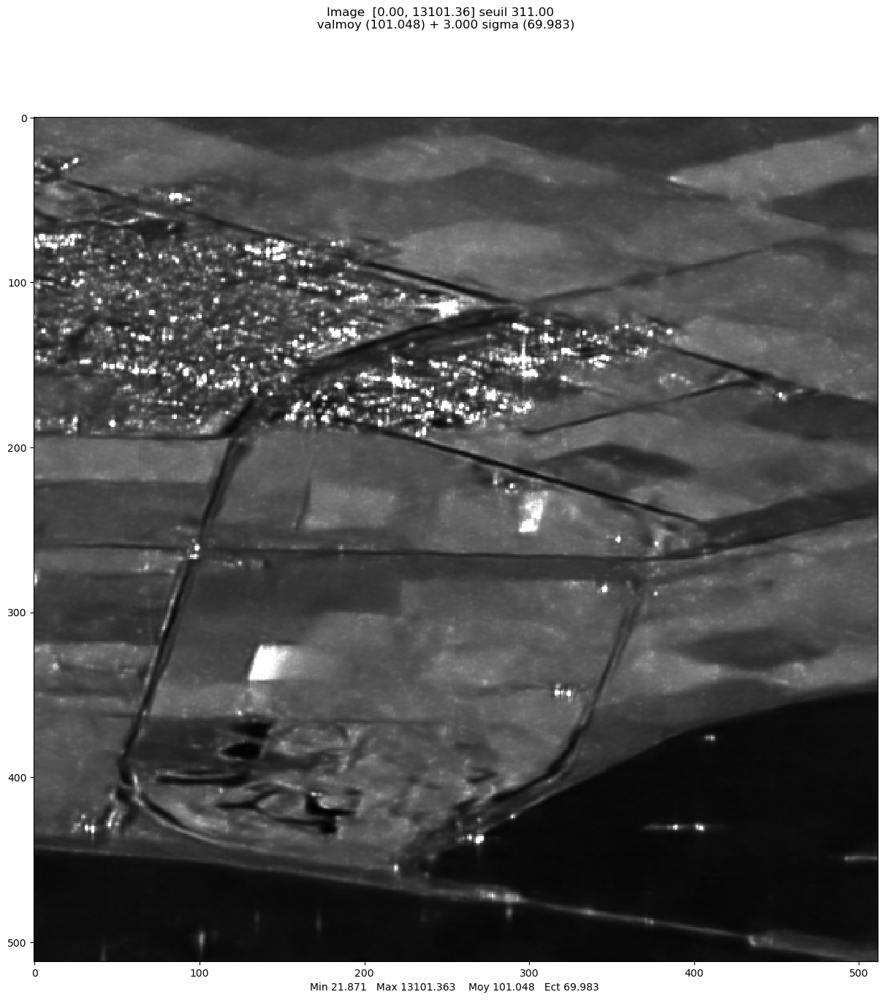

array([[108.26735687, 108.92593384, 117.21216583, ...,  87.13925171,
         89.79171753,  89.75721741],
       [105.54544067, 111.25749207, 116.15348053, ...,  95.23865509,
         96.19988251,  95.58480072],
       [105.72384644, 114.29315186, 116.50016022, ..., 100.59217072,
        100.78230286, 100.22771454],
       ...,
       [ 40.31035233,  38.88003159,  38.09856415, ...,  82.76222992,
         81.49038696,  81.83437347],
       [ 39.99552917,  38.5390358 ,  38.96235657, ...,  84.42482758,
         84.06273651,  83.64545441],
       [ 40.69298935,  38.59126282,  38.61891174, ...,  81.21070862,
         82.10493469,  87.46295166]])

In [15]:
# this image has already been processed by a CNN based filter
# !wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.IMA
# !wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.dim
im_lely_multitemp_denoised = mvalab.imz2mat("lely_tuple_multitemp_SAR2SAR.IMA")
# amplitude
im1_d = np.abs(im_lely_multitemp_denoised[0][:, :, 0])
mvalab.visusar(im1_d)

### Question C.4
Do a comparison between the CNN filtering and the Lee filter. Comment the two results. Are homogeneous areas well restored? Do the methods preserve edges and fine structures? Are artifacts introduced?

### Answer C.4

Upon comparing the outcomes of applying the Lee filter and CNN filtering, it becomes evident that SAR2SAR surpasses the Lee filter, offering cleaner homogeneous regions, superior edge preservation, and fewer artifacts. While the Lee filter effectively reduces speckle noise, residual noise persists in the image, and attempts to eliminate it by enlarging the window size lead to a compromise in detail preservation and image clarity due to increased blurring. In contrast, SAR2SAR excels in noise reduction, yielding remarkably smooth and clean homogeneous areas while maintaining sharp edges and fine details.

## C.5 Method noise
Performances of a denoising algorithm can be visually interpreted by looking at the *residual noise* (i.e. the ratio between the noisy image and the denoised image, in intensity). For a quantitative evaluation, we can look at the noise statistics, knowing that, in intensity, statistics of speckle S are:
- $\mu_S=1$
- $\sigma^2_S = \frac{1}{L}$

### Question C.5
Compute the aforementioned ratio image, mean value and variance for the image restored using the Lee filter and the result of SAR2SAR. Comment the results.

What is the interest of computing the method noise ? What are your conclusions for the two previous filters ?

### Answer C.5

The method noise serves as a valuable quantitative metric for assessing denoising algorithms like the Lee filter and SAR2SAR in reducing speckle noise within SAR images. By examining the mean and variance of the residual noise, derived from the ratio between a noisy image and its noise-free counterpart, we gain insights into how well the filters retain the statistical properties of speckle noise. In the provided results, both filters display average values slightly below the ideal threshold of 1, suggesting some loss of radiometric information, along with variance values below the expected threshold of 1/L, indicative of potential over-smoothing of the image. Notably, SAR2SAR exhibits a mean closer to 1 and marginally higher variance compared to the Lee filter, implying better preservation of radiometric information and texture details. Consequently, the method noise calculation offers valuable discernment into denoising filter performance, with SAR2SAR showcasing promising superiority in maintaining image characteristics.

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


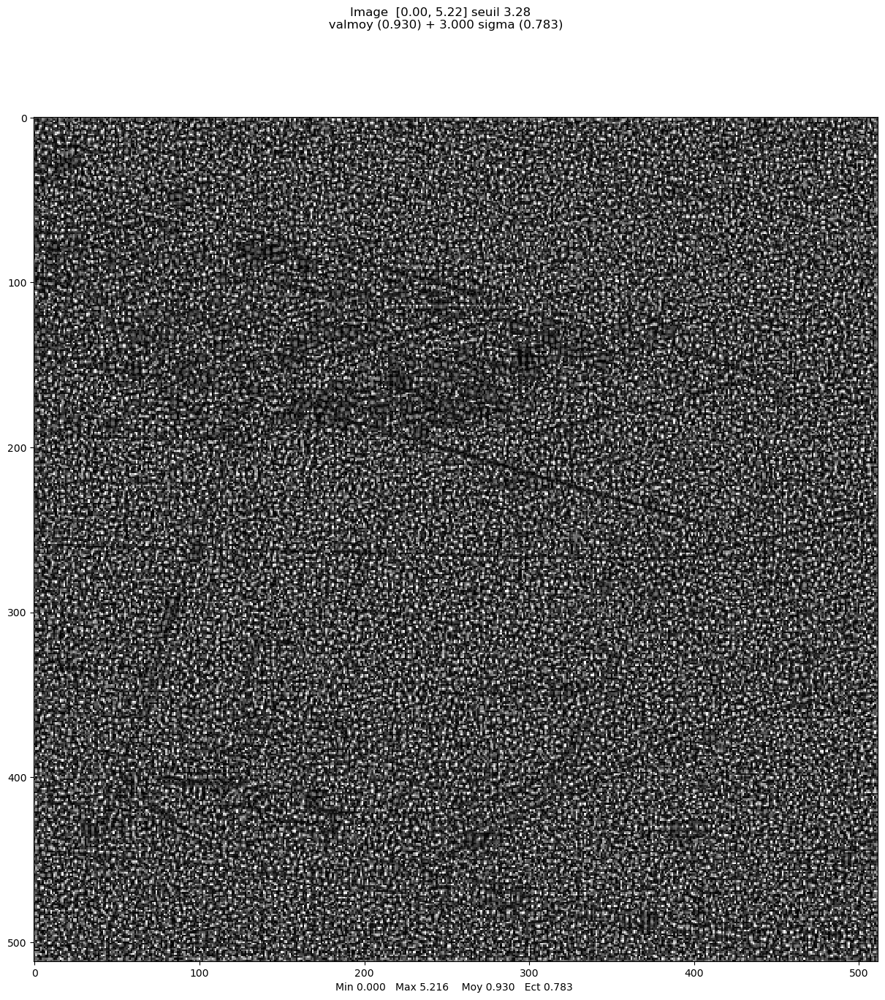

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


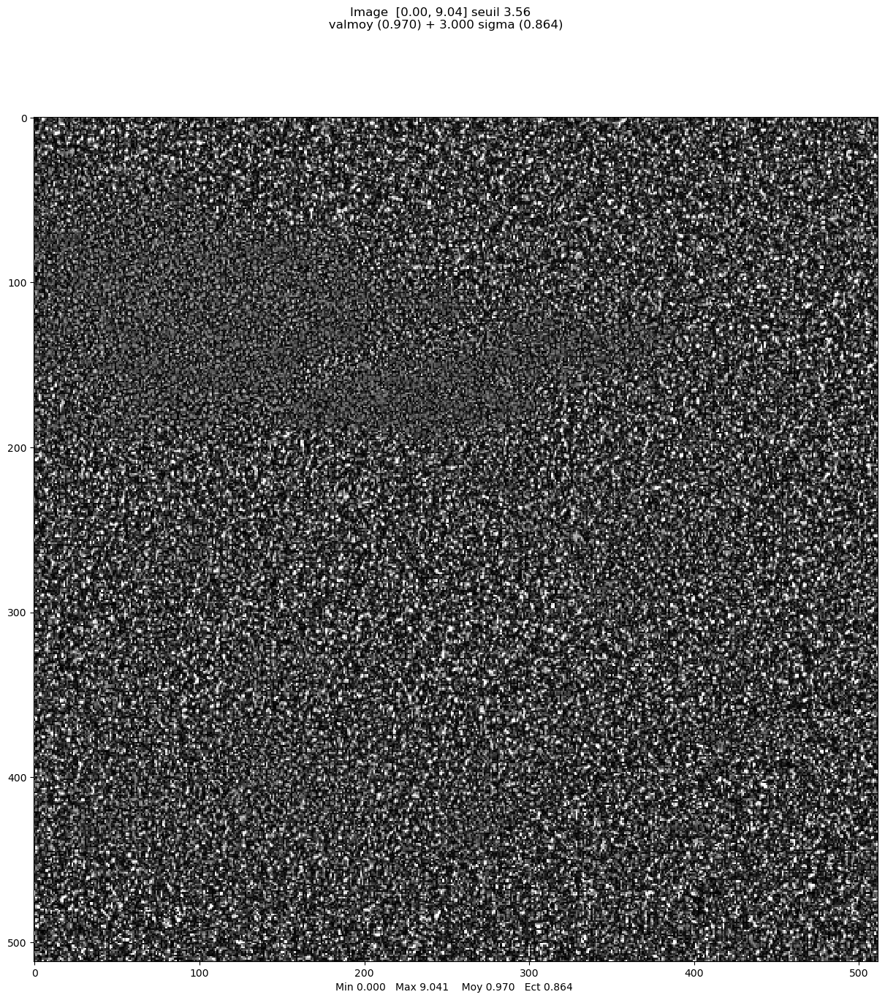

LEE FILTER: mean = 0.9301460471018858 and var = 0.6125495492720925
SAR2SAR: mean = 0.9697834638584217 and var = 0.7457658171745046


In [16]:
# Plot the residual noise
res_noise_lee = part_lely_int / lee_filtered_int
mvalab.visusar(res_noise_lee)
mean_lee = np.mean(res_noise_lee)
var_lee = np.var(res_noise_lee)

res_noise_deep = part_lely_int / (im1_d**2)
mvalab.visusar(res_noise_deep)
mean_deep = np.mean(res_noise_deep)
var_deep = np.var(res_noise_deep)

print("LEE FILTER: mean = " + str(mean_lee) + " and var = " + str(var_lee))
print("SAR2SAR: mean = " + str(mean_deep) + " and var = " + str(var_deep))